In [1]:
import cobra
from cobra import Reaction, Metabolite
from cobra.io import read_sbml_model
import networkx as nx
import matplotlib.pyplot as plt
model  = read_sbml_model('iJN1463.xml')
model_PAO1 = read_sbml_model('PAO1.xml')#铜绿假单胞菌的代谢模型 找鼠李糖脂代谢反应


In [26]:
model


Name,iJN1463
Memory address,203f1d92060
Number of metabolites,2153
Number of reactions,2927
Number of genes,1462
Number of groups,0
Objective expression,1.0*BIOMASS_KT2440_WT3 - 1.0*BIOMASS_KT2440_WT3_reverse_d86d5
Compartments,"cytosol, extracellular space, periplasm"


In [3]:
model_PAO1

Name,MODEL1507180020
Memory address,269d7a6a300
Number of metabolites,879
Number of reactions,1110
Number of genes,1054
Number of groups,0
Objective expression,1.0*PA_Biomass6_DM - 1.0*PA_Biomass6_DM_reverse_e4a05
Compartments,"cytosol, extracellular"


In [80]:
#查看注释信息
model.__dict__

{'_id': 'iJN1463',
 'name': 'Nogales2020 - Genome-scale metabolic network of Pseudomonas putida (iJN1462)',
 'notes': {},
 '_annotation': {'mamo': 'MAMO_0000009'},
 'genes': [<Gene PP_s0001 at 0x1f8ff0044a0>,
  <Gene PP_3591 at 0x1f8ff0043e0>,
  <Gene PP_1225 at 0x1f8ff004410>,
  <Gene PP_0723 at 0x1f8ff004560>,
  <Gene PP_1257 at 0x1f8ff0046b0>,
  <Gene PP_2637 at 0x1f8ff004800>,
  <Gene PP_2136 at 0x1f8ff004980>,
  <Gene PP_2008 at 0x1f8ff004aa0>,
  <Gene PP_0881 at 0x1f8ff004bf0>,
  <Gene PP_0880 at 0x1f8ff004d40>,
  <Gene PP_0878 at 0x1f8ff004e90>,
  <Gene PP_0885 at 0x1f8ff004fe0>,
  <Gene PP_0884 at 0x1f8ff005130>,
  <Gene PP_0882 at 0x1f8ff005250>,
  <Gene PP_2638 at 0x1f8ff005370>,
  <Gene PP_2636 at 0x1f8ff0054c0>,
  <Gene PP_2635 at 0x1f8ff005640>,
  <Gene PP_2734 at 0x1f8ff005760>,
  <Gene PP_0871 at 0x1f8ff0058b0>,
  <Gene PP_0870 at 0x1f8ff005a00>,
  <Gene PP_0296 at 0x1f8ff005b50>,
  <Gene PP_0295 at 0x1f8ff005c70>,
  <Gene PP_0294 at 0x1f8ff005d90>,
  <Gene PP_0869 at 0x

In [8]:
model_PAO1.__dict__

{'_id': 'MODEL1507180020',
 'name': 'Oberhardt2008 - Genome-scale metabolic network of Pseudomonas aeruginosa (iMO1056)',
 'notes': {'This model is hosted on \n  <a href="http': '//www.ebi.ac.uk/biomodels/">BioModels Database</a>\n  and identified by: \n  <a href="http://identifiers.org/biomodels.db/MODEL1507180020">MODEL1507180020</a>.',
  'To cite BioModels Database, please use': '<a href="http://identifiers.org/pubmed/20587024" title="Latest BioModels Database publication">BioModels Database:\n  An enhanced, curated and annotated resource for published\n  quantitative kinetic models</a>.',
  'To the extent possible under law, all copyright and related or\n  neighbouring rights to this encoded model have been dedicated to\n  the public domain worldwide. Please refer to \n  <a href="http': '//creativecommons.org/publicdomain/zero/1.0/" title="Access to: CC0 1.0 Universal (CC0 1.0), Public Domain Dedication">CC0\n  Public Domain Dedication</a> for more information.'},
 '_annotation': {

In [81]:
# 查看模型的数据库引用信息
if '_annotation' in model.__dict__:
    print("模型的数据库注释信息：")
    for key, value in model.annotation.items():
        print(f"{key}: {value}")
else:
    print("模型中没有找到数据库注释信息。")


模型的数据库注释信息：
mamo: MAMO_0000009


In [89]:
model_PAO1.__dict__

{'_id': 'MODEL1507180020',
 'name': 'Oberhardt2008 - Genome-scale metabolic network of Pseudomonas aeruginosa (iMO1056)',
 'notes': {'This model is hosted on \n  <a href="http': '//www.ebi.ac.uk/biomodels/">BioModels Database</a>\n  and identified by: \n  <a href="http://identifiers.org/biomodels.db/MODEL1507180020">MODEL1507180020</a>.',
  'To cite BioModels Database, please use': '<a href="http://identifiers.org/pubmed/20587024" title="Latest BioModels Database publication">BioModels Database:\n  An enhanced, curated and annotated resource for published\n  quantitative kinetic models</a>.',
  'To the extent possible under law, all copyright and related or\n  neighbouring rights to this encoded model have been dedicated to\n  the public domain worldwide. Please refer to \n  <a href="http': '//creativecommons.org/publicdomain/zero/1.0/" title="Access to: CC0 1.0 Universal (CC0 1.0), Public Domain Dedication">CC0\n  Public Domain Dedication</a> for more information.'},
 '_annotation': {

In [85]:
model_PAO1.annotation

{'biomodels.db': 'MODEL1507180020'}

In [57]:
gene_nas = [gene.name for gene in model_PAO1.genes]
print(gene_nas)

['PA0005', 'PA0006', 'PA0008', 'PA0009', 'PA0011', 'PA0023', 'PA0024', 'PA0025', 'PA0030', 'PA0035', 'PA0036', 'PA0051', 'PA0108', 'PA0119', 'PA0130', 'PA0132', 'PA0134', 'PA0136', 'PA0137', 'PA0138', 'PA0143', 'PA0148', 'PA0153', 'PA0154', 'PA0166', 'PA0195', 'PA0196', 'PA0203', 'PA0204', 'PA0205', 'PA0206', 'PA0208', 'PA0210', 'PA0211', 'PA0212', 'PA0215', 'PA0216', 'PA0219', 'PA0223', 'PA0228', 'PA0229', 'PA0230', 'PA0231', 'PA0232', 'PA0235', 'PA0242', 'PA0245', 'PA0247', 'PA0254', 'PA0265', 'PA0266', 'PA0280', 'PA0281', 'PA0282', 'PA0283', 'PA0288', 'PA0292', 'PA0293', 'PA0296', 'PA0298', 'PA0299', 'PA0300', 'PA0301', 'PA0302', 'PA0303', 'PA0304', 'PA0313', 'PA0314', 'PA0323', 'PA0324', 'PA0325', 'PA0326', 'PA0330', 'PA0331', 'PA0342', 'PA0347', 'PA0350', 'PA0352', 'PA0353', 'PA0363', 'PA0364', 'PA0390', 'PA0393', 'PA0399', 'PA0400', 'PA0402', 'PA0403', 'PA0407', 'PA0420', 'PA0430', 'PA0432', 'PA0437', 'PA0438', 'PA0441', 'PA0443', 'PA0447', 'PA0450', 'PA0476', 'PA0482', 'PA0500',

In [59]:
gene_ids = [gene.id for gene in model_PAO1.genes]
print(gene_ids)

['PA0005', 'PA0006', 'PA0008', 'PA0009', 'PA0011', 'PA0023', 'PA0024', 'PA0025', 'PA0030', 'PA0035', 'PA0036', 'PA0051', 'PA0108', 'PA0119', 'PA0130', 'PA0132', 'PA0134', 'PA0136', 'PA0137', 'PA0138', 'PA0143', 'PA0148', 'PA0153', 'PA0154', 'PA0166', 'PA0195', 'PA0196', 'PA0203', 'PA0204', 'PA0205', 'PA0206', 'PA0208', 'PA0210', 'PA0211', 'PA0212', 'PA0215', 'PA0216', 'PA0219', 'PA0223', 'PA0228', 'PA0229', 'PA0230', 'PA0231', 'PA0232', 'PA0235', 'PA0242', 'PA0245', 'PA0247', 'PA0254', 'PA0265', 'PA0266', 'PA0280', 'PA0281', 'PA0282', 'PA0283', 'PA0288', 'PA0292', 'PA0293', 'PA0296', 'PA0298', 'PA0299', 'PA0300', 'PA0301', 'PA0302', 'PA0303', 'PA0304', 'PA0313', 'PA0314', 'PA0323', 'PA0324', 'PA0325', 'PA0326', 'PA0330', 'PA0331', 'PA0342', 'PA0347', 'PA0350', 'PA0352', 'PA0353', 'PA0363', 'PA0364', 'PA0390', 'PA0393', 'PA0399', 'PA0400', 'PA0402', 'PA0403', 'PA0407', 'PA0420', 'PA0430', 'PA0432', 'PA0437', 'PA0438', 'PA0441', 'PA0443', 'PA0447', 'PA0450', 'PA0476', 'PA0482', 'PA0500',

In [62]:
target_genes = ['1']
for gene in model_PAO1.genes:
    for target in target_genes:
        if target.lower() in gene.id.lower() or target.lower() in gene.name.lower():
            print(f"找到的基因 - ID: {gene.id}, 名称: {gene.name}")
            reactions = gene.reactions
            for reaction in reactions:
                print(f"  相关反应ID: {reaction.id}, 反应名称: {reaction.name}")


找到的基因 - ID: PA0011, 名称: PA0011
  相关反应ID: PA_LIPDA, 反应名称: Pseudomonas Lipid A Reaction
找到的基因 - ID: PA0051, 名称: PA0051
  相关反应ID: PHE1Cs, 反应名称: phenazine-1-carboxamide synthetase
  相关反应ID: ASNS1, 反应名称: asparagine synthase (glutamine-hydrolysing)
找到的基因 - ID: PA0108, 名称: PA0108
  相关反应ID: CYOO3_2, 反应名称: cytochrome-c oxidase
找到的基因 - ID: PA0119, 名称: PA0119
  相关反应ID: OROTt2, 反应名称: orotate efflux via proton symport
  相关反应ID: SUCCt2b, 反应名称: Succinate efflux via proton symport
  相关反应ID: FUMt6, 反应名称: fumarate transport in/out via proton symport
  相关反应ID: MALt2, 反应名称: L-malate transport in via proton symport
  相关反应ID: MAL_Dt2, 反应名称: D-malate transport in via proton symport
找到的基因 - ID: PA0130, 名称: PA0130
  相关反应ID: MMSAD1, 反应名称: methylmalonate-semialdehyde dehydrogenase
  相关反应ID: MMSAD3, 反应名称: methylmalonate-semialdehyde dehydrogenase (malonic semialdehyde)
找到的基因 - ID: PA0132, 名称: PA0132
  相关反应ID: BALAAT, 反应名称: beta-alanine--pyruvate transaminase
找到的基因 - ID: PA0134, 名称: PA0134
  相关反应ID: GUADr, 反应名称: g

In [82]:
# 列出模型中的所有代谢物ID
metabolites_ids = [metabolite.id for metabolite in model.metabolites]
print(metabolites_ids)


['10fthf_c', '12dgr120_c', '12dgr140_c', '12dgr141_c', '12dgr160_c', '12dgr160_e', '12dgr161_c', '12dgr180_c', '12dgr180_e', '12dgr181_c', '13dampp_c', '13dampp_e', '13dampp_p', '3hvacccoa_c', '3ig3p_c', '3mb2coa_c', '3mb_c', '3mb_e', '13dpg_c', '15dap_c', '2me4p_c', '2mecdp_c', '3mb_p', '3mbzalc_c', '3mbzald_c', '2mp2coa_c', '3mcat_c', '2obut_c', '3mgcoa_c', '2ohph_c', '15dap_e', '3mob_c', '2ombzl_c', '3mop_c', '2omcm_c', '15dap_p', '3o6athcoa_c', '2omhmbl_c', '2ommbl_c', '3ocddec5eACP_c', '2omph_c', '2oph_c', '3ocmrs7eACP_c', '1ag160_e', '3ocpalm9eACP_c', '1ag180_e', '3ocvac11eACP_c', '1ag181d9_e', '3odcoa_c', '1ag182d9d12_e', '2oxoadp_c', '3odd5coa_c', '2oxpaccoa_c', '1agpe160_p', '2p4c2me_c', '3odd6coa_c', '1agpe161_p', '3oddccoa_c', '1agpe180_p', '2pg_c', '2pglyc_c', '3oddcoa_c', '1agpe181_p', '3oddecACP_c', '3odec4coa_c', '3odecACP_c', '2pqq_c', '3ohcoa_c', '3ohd58coa_c', '34dhbald_c', '1agpg160_p', '3ohd710coa_c', '1agpg161_p', '1agpg180_p', '34dhbz_c', '34dhbz_e', '3ohdccoa_c',

In [13]:
model.metabolites.get_by_id('2ahbut_c').annotation

{'sbo': 'SBO:0000247',
 'bigg.metabolite': '2ahbut',
 'biocyc': 'META:2-ACETO-2-HYDROXY-BUTYRATE',
 'chebi': ['CHEBI:27681', 'CHEBI:49256', 'CHEBI:18730', 'CHEBI:373'],
 'hmdb': ['HMDB06854', 'HMDB06900'],
 'inchi_key': 'VUQLHQFKACOHNZ-LURJTMIESA-M',
 'kegg.compound': 'C06006',
 'lipidmaps': 'LMFA01050383',
 'metanetx.chemical': 'MNXM114220',
 'sabiork': '2852',
 'seed.compound': 'cpd19045'}

In [2]:
for reaction in model.reactions:
    print(f"反应: {reaction.id}, 下限: {reaction.lower_bound}, 上限: {reaction.upper_bound}")

反应: 3HAD160, 下限: 0.0, 上限: 999999.0
反应: 13DAMPPabcpp, 下限: 0.0, 上限: 999999.0
反应: 13DAMPPtex, 下限: -999999.0, 上限: 999999.0
反应: 15DAPabcpp, 下限: 0.0, 上限: 999999.0
反应: 1P2CBXLCYCL, 下限: -999999.0, 上限: 999999.0
反应: 1P2CBXLR, 下限: 0.0, 上限: 999999.0
反应: 1PPDCRc, 下限: 0.0, 上限: 999999.0
反应: 1PQQS, 下限: -999999.0, 上限: 999999.0
反应: 1PY4h3cAH, 下限: 0.0, 上限: 999999.0
反应: 23CTI1, 下限: 0.0, 上限: 999999.0
反应: 23CTI2, 下限: 0.0, 上限: 999999.0
反应: 23CTI3, 下限: 0.0, 上限: 999999.0
反应: 24DECOAR, 下限: 0.0, 上限: 999999.0
反应: 25DKGLCNt2rpp, 下限: -999999.0, 上限: 999999.0
反应: 25DKGLCNtex, 下限: -999999.0, 上限: 999999.0
反应: 26DAHtex, 下限: -999999.0, 上限: 999999.0
反应: 2AACLPGT160, 下限: 0.0, 上限: 999999.0
反应: 2AACLPGT161, 下限: 0.0, 上限: 999999.0
反应: 2AACLPGT180, 下限: 0.0, 上限: 999999.0
反应: 2AACLPGT181, 下限: 0.0, 上限: 999999.0
反应: 2AACLPPEAT160, 下限: 0.0, 上限: 999999.0
反应: 2AACLPPEAT161, 下限: 0.0, 上限: 999999.0
反应: 2AACLPPEAT180, 下限: 0.0, 上限: 999999.0
反应: 2AACLPPEAT181, 下限: 0.0, 上限: 999999.0
反应: 2AGPE160tipp, 下限: 0.0, 上限: 999999.0
反应: 2AGPE161tipp, 下

In [17]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['hbut']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 2ahbut_c, 名称: (S)-2-Aceto-2-hydroxybutanoate, 分子式：C6H9O4, 电荷：-1


In [15]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['Polyhydroxyalkanoate']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: PHAg_c, 名称: Pre existent Polyhydroxyalkanoate granule, 分子式：ROH, 电荷：0
找到的代谢物 - ID: C100pPHA_c, 名称: C100 Medium chain length phenyl Polyhydroxyalkanoate, 分子式：C16H23O3R, 电荷：0
找到的代谢物 - ID: C120aPHA_c, 名称: C120 Medium chain length Polyhydroxyalkanoate, 分子式：C12H23O3R, 电荷：0
找到的代谢物 - ID: C121d6PHA_c, 名称: C121d5 Medium chain length Polyhydroxyalkanoate, 分子式：C12H21O3R, 电荷：0
找到的代谢物 - ID: C141aPHA_c, 名称: C141 Medium chain length Polyhydroxyalkanoate, 分子式：C14H25O3R, 电荷：0
找到的代谢物 - ID: C141d5PHA_c, 名称: C141 Medium chain length Polyhydroxyalkanoate  cis 5, 分子式：C14H25O3R, 电荷：0
找到的代谢物 - ID: C142PHA_c, 名称: C142 Medium chain length Polyhydroxyalkanoate, 分子式：C14H23O3R, 电荷：0
找到的代谢物 - ID: C40atPHA_c, 名称: C40 Medium chain length acetylthio Polyhydroxyalkanoate, 分子式：C6H9O4SR, 电荷：0
找到的代谢物 - ID: C40pPHA_c, 名称: C40 Medium chain length phenyl Polyhydroxyalkanoate, 分子式：C10H11O3R, 电荷：0
找到的代谢物 - ID: C50aPHA_c, 名称: C50 Medium chain length aliphatic Polyhydroxyalkanoate, 分子式：C5H9O3R, 电荷：0
找到的代谢物 - ID: C50p

In [21]:
model.metabolites.get_by_id('PHAg_c').reactions

frozenset({<Reaction PHADPC100 at 0x1e651ed31d0>,
           <Reaction PHADPC101 at 0x1e651ed3410>,
           <Reaction PHADPC120 at 0x1e651ed35c0>,
           <Reaction PHADPC121 at 0x1e651ed3740>,
           <Reaction PHADPC121d6 at 0x1e651ed38c0>,
           <Reaction PHADPC140 at 0x1e651ed3a40>,
           <Reaction PHADPC141 at 0x1e651ed3bc0>,
           <Reaction PHADPC141d5 at 0x1e651ed3d40>,
           <Reaction PHADPC142 at 0x1e651ed3ec0>,
           <Reaction PHADPC40 at 0x1e651ed3b30>,
           <Reaction PHADPC50 at 0x1e651ed3f80>,
           <Reaction PHADPC60 at 0x1e651f1c3e0>,
           <Reaction PHADPC70 at 0x1e651f1c500>,
           <Reaction PHADPC80 at 0x1e651f1c680>,
           <Reaction PHADPC90 at 0x1e651f1c800>,
           <Reaction PHADPCP100 at 0x1e651f1c980>,
           <Reaction PHADPCP40 at 0x1e651f1cb00>,
           <Reaction PHADPCP50 at 0x1e651f1cc80>,
           <Reaction PHADPCP60 at 0x1e651f1ce00>,
           <Reaction PHADPCP70 at 0x1e651f1cf80>,
 

In [6]:
model.reactions.get_by_id('PHADPCP70').gpr

cobra.core.gene.GPR('PP_5004')

In [13]:
target_genes = ['pha']
for gene in model.genes:
    for target in target_genes:
        if target.lower() in gene.id.lower() or target.lower() in gene.name.lower():
            print(f"找到的基因 - ID: {gene.id}, 名称: {gene.name}")
            reactions = gene.reactions
            for reaction in reactions:
                print(f"  相关反应ID: {reaction.id}, 反应名称: {reaction.name}")


找到的基因 - ID: PP_5340, 名称: aphA
  相关反应ID: CBPAH, 反应名称: N-carbamoylputrescine amidohydrolase
找到的基因 - ID: PP_5004, 名称: phaB
  相关反应ID: PHADPC140, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C140
  相关反应ID: PHADPC142, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C142
  相关反应ID: PHADPCP40, 反应名称: Poly 3 hydroxyalkanoate depolymerase  Phenyl C40
  相关反应ID: PHADPCP70, 反应名称: Poly 3 hydroxyalkanoate depolymerase  Phenyl C70
  相关反应ID: PHADPC60, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C60
  相关反应ID: PHADPC90, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C90
  相关反应ID: PHADPC141, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C141
  相关反应ID: PHADPC101, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C101
  相关反应ID: PHADPCT40, 反应名称: Poly 3 hydroxyalkanoate depolymerase  Acetylthio C40
  相关反应ID: PHADPC40, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C40
  相关反应ID: PHADPCP50, 反应名称: Poly 3 hydroxyalkanoate depolymerase  Phenyl C50
  相关反应ID: PHADPC80, 反应名称: Poly 3 hydroxyalkanoate depolymerase  C80
  相关反应ID: PHADPCP90,

In [14]:
model.genes.get_by_id('PP_5004').reactions

frozenset({<Reaction PHADPC100 at 0x203f01a3b30>,
           <Reaction PHADPC101 at 0x203f01a3d70>,
           <Reaction PHADPC120 at 0x203f01a3f20>,
           <Reaction PHADPC121 at 0x203f01a1700>,
           <Reaction PHADPC121d6 at 0x203f01a3fe0>,
           <Reaction PHADPC140 at 0x203f01ec410>,
           <Reaction PHADPC141 at 0x203f01ec560>,
           <Reaction PHADPC141d5 at 0x203f01ec6e0>,
           <Reaction PHADPC142 at 0x203f01ec860>,
           <Reaction PHADPC40 at 0x203f01ec9e0>,
           <Reaction PHADPC50 at 0x203f01ecb60>,
           <Reaction PHADPC60 at 0x203f01ecd10>,
           <Reaction PHADPC70 at 0x203f01ece60>,
           <Reaction PHADPC80 at 0x203f01ecfe0>,
           <Reaction PHADPC90 at 0x203f01ed160>,
           <Reaction PHADPCP100 at 0x203f01ed2e0>,
           <Reaction PHADPCP40 at 0x203f01ed460>,
           <Reaction PHADPCP50 at 0x203f01ed5e0>,
           <Reaction PHADPCP60 at 0x203f01ed760>,
           <Reaction PHADPCP70 at 0x203f01ed8e0>,
 

In [32]:
for reaction in model.genes.get_by_id('PP_5004').reactions:
    reaction.upper_bound = 1000
    print(f"Reaction ID: {reaction.id}, Bound:{reaction.bounds}")

Reaction ID: PHADPCP100, Bound:(0.0, 1000)
Reaction ID: PHADPCP50, Bound:(0.0, 1000)
Reaction ID: PHADPCT40, Bound:(0.0, 1000)
Reaction ID: PHADPCP40, Bound:(0.0, 1000)
Reaction ID: PHADPC50, Bound:(0.0, 1000)
Reaction ID: PHADPC141d5, Bound:(0.0, 1000)
Reaction ID: PHADPC100, Bound:(0.0, 1000)
Reaction ID: PHADPCP90, Bound:(0.0, 1000)
Reaction ID: PHADPC90, Bound:(0.0, 1000)
Reaction ID: PHADPC60, Bound:(0.0, 1000)
Reaction ID: PHADPC121, Bound:(0.0, 1000)
Reaction ID: PHADPC80, Bound:(0.0, 1000)
Reaction ID: PHADPCP80, Bound:(0.0, 1000)
Reaction ID: PHADPC142, Bound:(0.0, 1000)
Reaction ID: PHADPC140, Bound:(0.0, 1000)
Reaction ID: PHADPCT60, Bound:(0.0, 1000)
Reaction ID: PHADPCP60, Bound:(0.0, 1000)
Reaction ID: PHADPC121d6, Bound:(0.0, 1000)
Reaction ID: PHADPC141, Bound:(0.0, 1000)
Reaction ID: PHADPC120, Bound:(0.0, 1000)
Reaction ID: PHADPCP70, Bound:(0.0, 1000)
Reaction ID: PHADPC101, Bound:(0.0, 1000)
Reaction ID: PHADPC40, Bound:(0.0, 1000)
Reaction ID: PHADPC70, Bound:(0.0,

In [36]:
model.objective = 'RHLB'

ValueError: invalid objective

In [35]:

for reaction in model.genes.get_by_id('PP_5004').reactions:
    print(f"Reaction ID: {reaction.id}, Bound:{reaction.bounds}")
    reaction.upper_bound *= 2
    reaction.lower_bound *= 2
    solution = model.optimize()
    print(f"Reaction ID: {reaction.id}, Flux: {reaction.flux}, Bound:{reaction.bounds}")


Reaction ID: PHADPCP100, Bound:(0.0, 2000)
Reaction ID: PHADPCP100, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPCP50, Bound:(0.0, 2000)
Reaction ID: PHADPCP50, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPCT40, Bound:(0.0, 2000)
Reaction ID: PHADPCT40, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPCP40, Bound:(0.0, 2000)
Reaction ID: PHADPCP40, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC50, Bound:(0.0, 2000)
Reaction ID: PHADPC50, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC141d5, Bound:(0.0, 2000)
Reaction ID: PHADPC141d5, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC100, Bound:(0.0, 2000)
Reaction ID: PHADPC100, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPCP90, Bound:(0.0, 2000)
Reaction ID: PHADPCP90, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC90, Bound:(0.0, 2000)
Reaction ID: PHADPC90, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC60, Bound:(0.0, 2000)
Reaction ID: PHADPC60, Flux: 0.0, Bound:(0.0, 4000)
Reaction ID: PHADPC121, Bound:(0.0, 2000)
Reaction

In [22]:
model.reactions.get_by_id('SK_PHAg_c')

Reaction identifier,SK_PHAg_c
Name,PHA preexistent
Memory address,0x1e6523f7fe0
Stoichiometry,PHAg_c <=> Pre existent Polyhydroxyalkanoate granule <=>
GPR,
Lower bound,-999999.0
Upper bound,999999.0


In [18]:
model.metabolites.get_by_id('C40pPHA_c').reactions

frozenset({<Reaction DM_C40pPHA_c at 0x1e6513c09e0>,
           <Reaction PHADPCP40 at 0x1e651f1cb00>,
           <Reaction PHAPCP40 at 0x1e651f1f0e0>})

In [19]:
model.reactions.get_by_id('PHADPCP40')

Reaction identifier,PHADPCP40
Name,Poly 3 hydroxyalkanoate depolymerase Phenyl C40
Memory address,0x1e651f1cb00
Stoichiometry,C40pPHA_c + h2o_c --> PHAg_c + R_3hpba_c + h_c C40 Medium chain length phenyl Polyhydroxyalkanoate + H2O H2O --> Pre existent Polyhydroxyalkanoate granule + 3 Hydroxyphenylbutanoic acid + H+
GPR,PP_5004
Lower bound,0.0
Upper bound,999999.0


In [20]:
model.reactions.get_by_id('PHAPCP40')

Reaction identifier,PHAPCP40
Name,Poly 3 hydroxyalkanoate polymerase R 3 Hydroxyphenylbutyryl CoA
Memory address,0x1e651f1f0e0
Stoichiometry,PHAg_c + R_3hpbcoa_c --> C40pPHA_c + coa_c Pre existent Polyhydroxyalkanoate granule + 3 Hydroxyphenylbutanoyl CoA --> C40 Medium chain length phenyl Polyhydroxyalkanoate + Coenzyme A
GPR,PP_5003
Lower bound,0.0
Upper bound,999999.0


In [9]:
model.metabolites.get_by_id('C100aPHA_c').reactions

frozenset({<Reaction DM_C100aPHA_c at 0x1e65138f530>,
           <Reaction PHADPC100 at 0x1e651ed31d0>,
           <Reaction PHAP2C100 at 0x1e651f1d700>})

In [12]:
model.reactions.get_by_id('DM_C100aPHA_c')

Reaction identifier,DM_C100aPHA_c
Name,C100aPHA demand
Memory address,0x1e65138f530
Stoichiometry,C100aPHA_c --> C100 Medium chain length aliphatic Polyhydroxyalkanote -->
GPR,
Lower bound,0.0
Upper bound,999999.0


In [13]:
model.reactions.get_by_id('PHAP2C100')

Reaction identifier,PHAP2C100
Name,Poly 3 hydroxyalkanoate polymerase
Memory address,0x1e651f1d700
Stoichiometry,PHAg_c + R_3hdcoa_c --> C100aPHA_c + coa_c Pre existent Polyhydroxyalkanoate granule + (R)-Hydroxydecanoyl-CoA --> C100 Medium chain length aliphatic Polyhydroxyalkanote + Coenzyme A
GPR,PP_5003 or PP_5005
Lower bound,0.0
Upper bound,999999.0


In [11]:
model.reactions.get_by_id('PHADPC100')

Reaction identifier,PHADPC100
Name,Poly 3 hydroxyalkanoate depolymerase C100
Memory address,0x1e651ed31d0
Stoichiometry,C100aPHA_c + h2o_c --> PHAg_c + R_3hdcaa_c + h_c C100 Medium chain length aliphatic Polyhydroxyalkanote + H2O H2O --> Pre existent Polyhydroxyalkanoate granule + 3 hydroxydecanoic acid + H+
GPR,PP_5004
Lower bound,0.0
Upper bound,999999.0


In [35]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['nad_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: dnad_c, 名称: Deamino-NAD+, 分子式：C21H24N6O15P2, 电荷：-2
找到的代谢物 - ID: nad_c, 名称: Nicotinamide adenine dinucleotide, 分子式：C21H26N7O14P2, 电荷：-1


In [13]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['NAD']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: dnad_c, 名称: Deamino-NAD+, 分子式：C21H24N6O15P2, 电荷：-2
找到的代谢物 - ID: nad_c, 名称: Nicotinamide adenine dinucleotide, 分子式：C21H26N7O14P2, 电荷：-1
找到的代谢物 - ID: nadh_c, 名称: Nicotinamide adenine dinucleotide - reduced, 分子式：C21H27N7O14P2, 电荷：-2
找到的代谢物 - ID: nadp_c, 名称: Nicotinamide adenine dinucleotide phosphate, 分子式：C21H25N7O17P3, 电荷：-3
找到的代谢物 - ID: nadph_c, 名称: Nicotinamide adenine dinucleotide phosphate - reduced, 分子式：C21H26N7O17P3, 电荷：-4


In [34]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['h_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 2ohph_c, 名称: 2-Octaprenyl-6-hydroxyphenol, 分子式：C46H70O2, 电荷：0
找到的代谢物 - ID: 2omph_c, 名称: 2-Octaprenyl-6-methoxyphenol, 分子式：C47H72O2, 电荷：0
找到的代谢物 - ID: 2oph_c, 名称: 2-Octaprenylphenol, 分子式：C46H70O, 电荷：0
找到的代谢物 - ID: 2ameph_c, 名称: 2-Aminoethylphosphonate, 分子式：C2H7NO3P, 电荷：-1
找到的代谢物 - ID: 4hoxoh_c, 名称: 4-Hydroxy-2-oxohexanoic acid, 分子式：C6H9O4, 电荷：-1
找到的代谢物 - ID: Sfglutth_c, 名称: S-Formylglutathione, 分子式：C11H16N3O7S, 电荷：-1
找到的代谢物 - ID: C101PAH_c, 名称: C101 Medium chain length aliphatic Polyhydroxyalkanote, 分子式：C10H17O3R, 电荷：0
找到的代谢物 - ID: anth_c, 名称: Anthranilate, 分子式：C7H6NO2, 电荷：-1
找到的代谢物 - ID: conialdh_c, 名称: Coniferyl aldehyde, 分子式：C10H10O3, 电荷：0
找到的代谢物 - ID: etoh_c, 名称: Ethanol, 分子式：C2H6O, 电荷：0
找到的代谢物 - ID: h_c, 名称: H+, 分子式：H, 电荷：1
找到的代谢物 - ID: iscssh_c, 名称: IscS with bound sulfur, 分子式：HS2R, 电荷：0
找到的代谢物 - ID: lipa_oh_c, 名称: KDO 2  lipid  A  hydroxilated, 分子式：C96H168N2O41P2, 电荷：-6
找到的代谢物 - ID: meoh_c, 名称: Methanol, 分子式：CH4O1, 电荷：0
找到的代谢物 - ID: moadcosh_c, 名称: MoaD Protein with 

In [33]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['o2_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: co2_c, 名称: CO2 CO2, 分子式：CO2, 电荷：0
找到的代谢物 - ID: cro2_c, 名称: Chromite, 分子式：CrO2, 电荷：-1
找到的代谢物 - ID: dmso2_c, 名称: Dimethyl sulfone, 分子式：C2H6O2S, 电荷：0
找到的代谢物 - ID: h2o2_c, 名称: Hydrogen peroxide, 分子式：H2O2, 电荷：0
找到的代谢物 - ID: no2_c, 名称: Nitrite, 分子式：NO2, 电荷：-1
找到的代谢物 - ID: o2_c, 名称: O2 O2, 分子式：O2, 电荷：0
找到的代谢物 - ID: so2_c, 名称: Sulfur dioxide, 分子式：O2S, 电荷：0


In [5]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['3hdecACP_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 3hdecACP_c, 名称: (R)-3-Hydroxydecanoyl-[acyl-carrier protein], 分子式：C21H39N2O9PRS, 电荷：-1


In [13]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['3hdeACP_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

In [10]:
model.metabolites.get_by_id('3hdecACP_c').annotation

{'sbo': 'SBO:0000247',
 'bigg.metabolite': '3hdecACP',
 'biocyc': 'META:Beta-hydroxydecanoyl-ACPs',
 'kegg.compound': 'C04619',
 'metanetx.chemical': 'MNXM7127',
 'seed.compound': 'cpd11482'}

In [11]:
model.metabolites.get_by_id('3hdecACP_c').reactions

frozenset({<Reaction 3HAACOAT100 at 0x268717a3500>,
           <Reaction 3HAD100 at 0x268717c4b90>,
           <Reaction 3OAR100 at 0x268730d0c50>,
           <Reaction UAGAAT2_1 at 0x26872aee4b0>})

In [12]:
for reaction in model.metabolites.get_by_id('3hdecACP_c').reactions:
    print(reaction.check_mass_balance())

{}
{}
{}
{}


In [44]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['ACP']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 3ocddec5eACP_c, 名称: 3-oxo-cis-dodec-5-enoyl-[acyl-carrier protein], 分子式：C23H39N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ocmrs7eACP_c, 名称: 3-oxo-cis-myristol-7-eoyl-[acyl-carrier protein], 分子式：C25H43N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ocpalm9eACP_c, 名称: 3-oxo-cis-palm-9-eoyl-[acyl-carrier protein], 分子式：C27H47N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ocvac11eACP_c, 名称: 3-oxo-cis-vacc-11-enoyl-[acyl-carrier protein], 分子式：C29H51N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3oddecACP_c, 名称: 3-Oxododecanoyl-[acyl-carrier protein], 分子式：C23H41N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3odecACP_c, 名称: 3-Oxodecanoyl-[acyl-carrier protein], 分子式：C21H37N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ohexACP_c, 名称: 3-Oxohexanoyl-[acyl-carrier protein], 分子式：C17H29N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3omrsACP_c, 名称: 3-Oxotetradecanoyl-[acyl-carrier protein], 分子式：C25H45N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ooctACP_c, 名称: 3-Oxooctanoyl-[acyl-carrier protein], 分子式：C19H33N2O9PRS, 电荷：-1
找到的代谢物 - ID: 3ooctdACP_c, 名称: 3-Oxooctadecanoyl-[acyl-carrier protein], 分子式：C29H53N2O9PRS, 电荷：-1
找到的代谢物 - ID:

In [41]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['3haACP_c']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 3haACP_c, 名称: (3R)-3-Hydroxyacyl-[acyl-carrier protein], 分子式：C15H27N2O9PRS, 电荷：-1


In [27]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['3,4-Dihydroxybenzoate']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 34dhbz_c, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1
找到的代谢物 - ID: 34dhbz_e, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1
找到的代谢物 - ID: 34dhbz_p, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1


In [69]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['h2o']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 4h2opntn_c, 名称: 4-Hydroxy-2-oxopentanoate, 分子式：C5H7O4, 电荷：-1
找到的代谢物 - ID: h2o2_c, 名称: Hydrogen peroxide, 分子式：H2O2, 电荷：0
找到的代谢物 - ID: h2o2_e, 名称: Hydrogen peroxide, 分子式：H2O2, 电荷：0
找到的代谢物 - ID: h2o2_p, 名称: Hydrogen peroxide, 分子式：H2O2, 电荷：0
找到的代谢物 - ID: h2o_c, 名称: H2O H2O, 分子式：H2O, 电荷：0
找到的代谢物 - ID: h2o_e, 名称: H2O H2O, 分子式：H2O, 电荷：0
找到的代谢物 - ID: h2o_p, 名称: H2O H2O, 分子式：H2O, 电荷：0


In [27]:
# 使用部分名称匹配查找代谢物
#'protocat', 'polyhydroxyalkanoate', 'hydroxyacyl', 'ACP', 'terephthalate', 'hydroxyalkanoyloxy’， ‘alkanoic acid', 'rha', 'PCA','Dihydroxyphenylacetate','Hydroxyphenylacetate','Dihydroxybenzoate','Carboxymuconolactone','Oxoadipate','keto'
target_metabolites = ['3,4-Dihydroxybenzoate']
for metabolite in model.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 34dhbz_c, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1
找到的代谢物 - ID: 34dhbz_e, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1
找到的代谢物 - ID: 34dhbz_p, 名称: 3,4-Dihydroxybenzoate, 分子式：C7H5O4, 电荷：-1


In [25]:
target_metabolites = ['3h3h_c']
for metabolite in model_PAO1.metabolites:
    for target in target_metabolites:
        if target.lower() in metabolite.name.lower() or target.lower() in metabolite.id.lower():
            print(f"找到的代谢物 - ID: {metabolite.id}, 名称: {metabolite.name}, 分子式：{metabolite.formula}, 电荷：{metabolite.charge}")

找到的代谢物 - ID: 3h3h_c, 名称: 3-hydroxydecanoyl-3-hydroxydecanoate, 分子式：None, 电荷：0


In [43]:
model_PAO1.metabolites.get_by_id('alkanoate').reactions

KeyError: 'alkanoate'

In [12]:
model_PAO1.metabolites.get_by_id('dtdpddm_c').reactions

frozenset({<Reaction RHLB at 0x2a18ba03c50>,
           <Reaction RHLC at 0x2a18ba03dd0>,
           <Reaction TDPDRE at 0x2a18ba16180>,
           <Reaction TDPDRR at 0x2a18ba16870>})

In [13]:
model_PAO1.reactions.get_by_id('TDPDRR')

Reaction identifier,TDPDRR
Name,dTDP-4-dehydrorhamnose reductase
Memory address,0x2a18ba16870
Stoichiometry,dtdp6dm_c + nadp_c <=> dtdpddm_c + h_c + nadph_c dTDP-6-deoxy-L-mannose + Nicotinamide adenine dinucleotide phosphate <=> dTDP-4-dehydro-6-deoxy-L-mannose + H+ + Nicotinamide adenine dinucleotide phosphate - reduced
GPR,PA5162
Lower bound,-1000.0
Upper bound,1000.0


In [3]:
model.metabolites.get_by_id('dtdprmn_c').reactions

frozenset({<Reaction TDPDRR at 0x2a189f614c0>})

In [16]:
model.metabolites.get_by_id('dtdp_c').charge

-3

In [17]:
model.metabolites.get_by_id('dtdprmn_c').charge

-2

In [4]:
model.reactions.get_by_id('TDPDRR')

Reaction identifier,TDPDRR
Name,DTDP-4-dehydrorhamnose reductase
Memory address,0x2a189f614c0
Stoichiometry,dtdp4d6dm_c + h_c + nadph_c --> dtdprmn_c + nadp_c DTDP-4-dehydro-6-deoxy-L-mannose + H+ + Nicotinamide adenine dinucleotide phosphate - reduced --> DTDP-L-rhamnose + Nicotinamide adenine dinucleotide phosphate
GPR,PP_1784 or PP_0500
Lower bound,0.0
Upper bound,999999.0


In [79]:
model.metabolites.get_by_id('3haACP_c').reactions

frozenset({<Reaction 3HAD40 at 0x231e08ee2a0>,
           <Reaction 3OAR40 at 0x231e09411f0>})

In [15]:
model.reactions.get_by_id('3HAD40')

Reaction identifier,3HAD40
Name,3-hydroxyacyl-[acyl-carrier-protein] dehydratase (n-C4:0)
Memory address,0x2a18b6ed580
Stoichiometry,3haACP_c --> but2eACP_c + h2o_c (3R)-3-Hydroxyacyl-[acyl-carrier protein] --> But-2-enoyl-[acyl-carrier protein] + H2O H2O
GPR,PP_1602 or PP_4174
Lower bound,0.0
Upper bound,999999.0


In [71]:
model.metabolites.get_by_id('3hdecACP_c').reactions

frozenset({<Reaction 3HAACOAT100 at 0x231df459d30>,
           <Reaction 3HAD100 at 0x231df45a570>,
           <Reaction 3OAR100 at 0x231e08efa40>,
           <Reaction UAGAAT2_1 at 0x231e033f680>})

In [78]:
model.reactions.get_by_id('3HAACOAT100')

Reaction identifier,3HAACOAT100
Name,3 Hydroxyacyl ACPCoA Transacylase
Memory address,0x231df459d30
Stoichiometry,3hdecACP_c + coa_c <=> ACP_c + R_3hdcoa_c (R)-3-Hydroxydecanoyl-[acyl-carrier protein] + Coenzyme A <=> Acyl carrier protein + (R)-Hydroxydecanoyl-CoA
GPR,PP_1408
Lower bound,-999999.0
Upper bound,999999.0


In [54]:
model_PAO1.metabolites.get_by_id('3h3h_c').reactions

frozenset({<Reaction 3H3H at 0x231df800890>, <Reaction RHLB at 0x231e0c4fe90>})

In [46]:
model_PAO1.metabolites.get_by_id('llrhh_c').reactions

frozenset({<Reaction DM_llrhh_c at 0x231e0ca6210>,
           <Reaction RHLC at 0x231e0c4fcb0>})

In [49]:
model_PAO1.metabolites.get_by_id('lrhh_c').reactions

frozenset({<Reaction RHLB at 0x231e0c4fe90>, <Reaction RHLC at 0x231e0c4fcb0>})

In [38]:
model_PAO1.metabolites.get_by_id('3hdccoa_c').reactions

frozenset({<Reaction PHAC at 0x2a18b9e67b0>, <Reaction RHLA at 0x2a18ba03b00>})

In [81]:
model_PAO1.metabolites.get_by_id('2beACP_c').reactions

frozenset({<Reaction BTMAT1 at 0x231df638e30>,
           <Reaction HBUHL1 at 0x231df43fcb0>})

In [82]:
model_PAO1.reactions.get_by_id('BTMAT1')

Reaction identifier,BTMAT1
Name,Butyryl-[acyl-carrier protein]:malonyl-CoA C-acyltransferase
Memory address,0x231df638e30
Stoichiometry,2beACP_c + h_c + nadh_c --> butACP_c + nad_c But-2-enoyl-[acyl-carrier protein] + H+ + Nicotinamide adenine dinucleotide - reduced --> Butyryl-[acyl-carrier protein] + Nicotinamide adenine dinucleotide
GPR,PA1806
Lower bound,0.0
Upper bound,1000.0


In [82]:
model_PAO1.reactions.get_by_id('BTMAT1')

Reaction identifier,BTMAT1
Name,Butyryl-[acyl-carrier protein]:malonyl-CoA C-acyltransferase
Memory address,0x231df638e30
Stoichiometry,2beACP_c + h_c + nadh_c --> butACP_c + nad_c But-2-enoyl-[acyl-carrier protein] + H+ + Nicotinamide adenine dinucleotide - reduced --> Butyryl-[acyl-carrier protein] + Nicotinamide adenine dinucleotide
GPR,PA1806
Lower bound,0.0
Upper bound,1000.0


In [55]:
model_PAO1.reactions.get_by_id('3H3H')

Reaction identifier,3H3H
Name,unknown enzyme
Memory address,0x231df800890
Stoichiometry,2bhdccoa_c + h2o_c --> 3h3h_c + coa_c beta-hydroxydecanoyl-beta-hydroxydecanoyl-S-CoA + H2O --> 3-hydroxydecanoyl-3-hydroxydecanoate + Coenzyme A
GPR,
Lower bound,0.0
Upper bound,1000.0


In [48]:
model_PAO1.reactions.get_by_id('RHLC')

Reaction identifier,RHLC
Name,rhamnosyltransferase 2
Memory address,0x231e0c4fcb0
Stoichiometry,dtdpddm_c + h_c + lrhh_c --> dtdp_c + llrhh_c dTDP-4-dehydro-6-deoxy-L-mannose + H+ + L-rhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate --> dTDP + L-rhamnosyl-Lrhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate
GPR,PA1130
Lower bound,0.0
Upper bound,1000.0


In [52]:
model_PAO1.reactions.get_by_id('DM_llrhh_c')

Reaction identifier,DM_llrhh_c
Name,demand_L-rhamnosyl-Lrhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate
Memory address,0x231e0ca6210
Stoichiometry,llrhh_c --> L-rhamnosyl-Lrhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate -->
GPR,
Lower bound,0.0
Upper bound,0.0


In [39]:
model_PAO1.reactions.get_by_id('PHAC')

Reaction identifier,PHAC
Name,poly(3-hydroxyalkanoic acid) synthase
Memory address,0x2a18b9e67b0
Stoichiometry,2.0 3hdccoa_c --> 2bhdccoa_c + coa_c 2.0 (S)-3-Hydroxydecanoyl-CoA --> beta-hydroxydecanoyl-beta-hydroxydecanoyl-S-CoA + Coenzyme A
GPR,PA5056 or PA5058
Lower bound,0.0
Upper bound,1000.0


In [37]:
model_PAO1.reactions.get_by_id('RHLA')

Reaction identifier,RHLA
Name,rhamnosyltransferase chain A
Memory address,0x2a18ba03b00
Stoichiometry,3hdeACP_c + coa_c --> 3hdccoa_c + ACP_c (3R)-3-Hydroxydecanoyl-[acyl-carrier protein] + Coenzyme A --> (S)-3-Hydroxydecanoyl-CoA + acyl carrier protein
GPR,PA3479
Lower bound,0.0
Upper bound,1000.0


In [50]:
model_PAO1.reactions.get_by_id('RHLB')

Reaction identifier,RHLB
Name,rhamnosyltransferase chain B
Memory address,0x231e0c4fe90
Stoichiometry,3h3h_c + dtdpddm_c + h_c --> dtdp_c + lrhh_c 3-hydroxydecanoyl-3-hydroxydecanoate + dTDP-4-dehydro-6-deoxy-L-mannose + H+ --> dTDP + L-rhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate
GPR,PA3478
Lower bound,0.0
Upper bound,1000.0


In [27]:
model_PAO1.metabolites.get_by_id('2beACP_c').reactions

frozenset({<Reaction BTMAT1 at 0x231df638e30>,
           <Reaction HBUHL1 at 0x231df43fcb0>})

In [30]:
model_PAO1.reactions.get_by_id('HBUHL1')

Reaction identifier,HBUHL1
Name,(3R)-3-Hydroxybutanoyl-[acyl-carrier-protein] hydro-lyase
Memory address,0x231df43fcb0
Stoichiometry,3hbACP_c --> 2beACP_c + h2o_c (3R)-3-Hydroxybutanoyl-[acyl-carrier protein] --> But-2-enoyl-[acyl-carrier protein] + H2O
GPR,PA1610 or PA3645
Lower bound,0.0
Upper bound,1000.0


In [31]:
model_PAO1.metabolites.get_by_id('3hbACP_c').reactions

frozenset({<Reaction HBUHL1 at 0x231df43fcb0>,
           <Reaction HBUR1 at 0x231df43fa10>})

In [32]:
model_PAO1.reactions.get_by_id('HBUR1')

Reaction identifier,HBUR1
Name,(3R)-3-Hydroxybutanoyl-[acyl-carrier protein]:NADP+ oxidoreductase
Memory address,0x231df43fa10
Stoichiometry,actACP_c + h_c + nadph_c --> 3hbACP_c + nadp_c Acetoacetyl-ACP + H+ + Nicotinamide adenine dinucleotide phosphate - reduced --> (3R)-3-Hydroxybutanoyl-[acyl-carrier protein] + Nicotinamide adenine dinucleotide phosphate
GPR,(PA1827 or PA4148 or PA4162 or PA3106 or PA3106 or PA4786 or PA5524) or PA2967
Lower bound,0.0
Upper bound,1000.0


In [47]:
# 列出模型中的所有反应ID
reaction_ids = [reaction.id for reaction in model.reactions]
print(reaction_ids)


['3HAD160', '13DAMPPabcpp', '13DAMPPtex', '15DAPabcpp', '1P2CBXLCYCL', '1P2CBXLR', '1PPDCRc', '1PQQS', '1PY4h3cAH', '23CTI1', '23CTI2', '23CTI3', '24DECOAR', '25DKGLCNt2rpp', '25DKGLCNtex', '26DAHtex', '2AACLPGT160', '2AACLPGT161', '2AACLPGT180', '2AACLPGT181', '2AACLPPEAT160', '2AACLPPEAT161', '2AACLPPEAT180', '2AACLPPEAT181', '2AGPE160tipp', '2AGPE161tipp', '2AGPE180tipp', '2AGPE181tipp', '2AGPG160tipp', '2AGPG161tipp', '2AGPG180tipp', '2AGPG181tipp', '2DHGLCK', '2DHGLCNkt_tpp', '2DHGLCNtex', '2PQQS', '34DHCINMtex', '34DHCINMtpp', '34DHPHEtex', '34DHPHEtpp', '34HPPOR', '3AIBT2', '3HAACOAT100', '3HAACOAT120', '3HAACOAT121', '3HAACOAT140', '3HAACOAT141', '3HAACOAT60', '3HAACOAT80', '3HAD100', '3HAD120', '3HAD121', '3HAD140', '3HAD141', 'ACOAD31f', 'ACOAD32f', 'ACOAD33f', 'ACOAD34f', 'ACOAD3f', 'ACOAD4f', 'ACOAD5f', 'ACOAD6f', 'ACOAD7f', 'ACOAD8f', 'ACOADH1', 'ACOADH2', 'ACOATA', 'ACODA', 'ACONCt4pp', 'ACONCtex', 'ACONIs', 'ACONMT', 'ACONTa', 'ACONTb', 'ACOTA', 'ACPPAT120', 'ACPPAT140',

In [53]:
for reaction in model.reactions:  
    if 'PHA' in reaction.id.lower() or 'PHA' in reaction.name.lower(): 
        print(f"反应ID: {reaction.id}")
        print(f"反应名称: {reaction.name}")
        print(f"反应方程: {reaction.reaction}")
        print(f"下限: {reaction.lower_bound}")
        print(f"上限: {reaction.upper_bound}")
        print("\n")
      

In [86]:
# 查找包含"biomass"的反应ID
biomass_reactions = [reaction for reaction in reaction_ids if 'biomass' in reaction.lower()]
print(f"生物质反应ID: {biomass_reactions}")

生物质反应ID: ['BIOMASS_KT2440_Core2', 'BIOMASS_KT2440_WT3']


In [87]:
# 显示反应的具体内容
for biomass_reaction_id in biomass_reactions:
    reaction = model.reactions.get_by_id(biomass_reaction_id)
    print(f"反应ID: {reaction.id}")
    print(f"反应名称: {reaction.name}")
    print(f"反应方程: {reaction.reaction}")
    print(f"下限: {reaction.lower_bound}")
    print(f"上限: {reaction.upper_bound}")
    print("\n")

#这两个生物质反应 (BIOMASS_KT2440_Core2 和 BIOMASS_KT2440_WT3) 主要区别在于其代谢物组成和相应的比例。这些差异反映了模型中不同的生物质组成或代谢需求。这种差异可能基于不同的实验条件或不同的细胞状态（如生长阶段或营养状态）。
#具体差异分析：
#代谢物组成：
#两个反应中的代谢物种类和数量略有不同。某些特定代谢物在一个反应中出现，而在另一个反应中没有出现。
#例如，BIOMASS_KT2440_WT3 中有 adocbl_c（腺苷钴胺）和 lpspput_e（某种脂多糖），而 BIOMASS_KT2440_Core2 中没有这些代谢物。
#代谢物比例：
#即使在两种生物质反应中出现的代谢物相同，它们的比例也可能有所不同。比如在 BIOMASS_KT2440_Core2 和 BIOMASS_KT2440_WT3 中，许多氨基酸、核苷酸和其他代谢物的数量或系数都不同。
#反应的命名：
#反应的命名和描述有时会指示它们的具体适用范围。Core2 可能指代核心生物质成分或特定条件下的核心代谢需求，而 WT3 可能是基于某些特定的实验条件或环境下的野生型状态。

反应ID: BIOMASS_KT2440_Core2
反应名称: Biomass P putida KT2440  aa DNA RNA ATP murein FA ions
反应方程: 0.000223 10fthf_c + 0.000223 2fe2s_c + 0.000223 4fe4s_c + 0.000223 5mthf_c + 0.000279 accoa_c + 0.598267 ala__L_c + 0.000223 amet_c + 0.354251 arg__L_c + 0.158931 asn__L_c + 0.284685 asp__L_c + 46.918883 atp_c + 0.000223 btamp_c + 0.004226 ca2_c + 0.000223 chor_c + 0.004226 cl_c + 0.000167 coa_c + 0.002817 cobalt2_c + 0.159783 ctp_c + 0.002817 cu2_c + 0.055652 cys__L_c + 0.010804 datp_c + 0.01721 dctp_c + 0.017423 dgtp_c + 0.010854 dttp_c + 0.000223 fad_c + 0.00634 fe2_c + 0.00634 fe3_c + 0.251507 gln__L_c + 0.301809 glu__L_c + 0.431309 gly_c + 0.210704 gtp_c + 41.397362 h2o_c + 0.000223 hemeO_c + 0.126289 his__L_c + 0.244551 ile__L_c + 0.158509 k_c + 0.628769 leu__L_c + 3e-06 lipopb_c + 0.180336 lys__L_c + 3.1e-05 malcoa_c + 0.122008 met__L_c + 0.007044 mg2_c + 0.000223 mlthf_c + 0.002817 mobd_c + 0.012699 murein5px4p_p + 0.003522 na1_c + 0.001786 nad_c + 4.4e-05 nadh_c + 0.000111 nadp_c + 0.

In [12]:
EX_reactions = model.exchanges
for reaction_id in EX_reactions:
    print(reaction_id.reaction)

12dgr160_e --> 
12dgr180_e --> 
13dampp_e --> 
15dap_e --> 
1ag160_e --> 
1ag180_e --> 
1ag181d9_e --> 
1ag182d9d12_e --> 
25dkglcn_e --> 
26dap__M_e --> 
2ameph_e --> 
2ddglcn_e --> 
2dhglcn_e --> 
2m35mdntha_e --> 
34dhbz_e --> 
34dhcinm_e --> 
34dhphe_e --> 
35dnta_e --> 
3h4atb_e --> 
3mb_e --> 
btd_RR_e --> 
btn_e --> 
butso3_e --> 
bz_e --> 
ca2_e <=> 
carn_e --> 
catechol_e --> 
cbi_e --> 
cbl1_e --> 
cd2_e --> 
cell4_e --> 
cgly_e --> 
chol_e --> 
chols_e --> 
chor_e --> 
cinnm_e --> 
cit_e --> 
cl_e <=> 
cm_e --> 
cmcbtt_e --> 
co2_e <=> 
co_e --> 
cobalt2_e <=> 
confrl_e --> 
creat_e --> 
crn_e --> 
cro2_e --> 
cro4_e --> 
crtn_e --> 
csn_e --> 
cu2_e <=> 
cu_e --> 
cyan_e --> 
cys__D_e --> 
cys__L_e --> 
dag181d9_e --> 
dag182d9d12_e --> 
dca_e --> 
ddca_e --> 
dgudbutn_e --> 
dmanur_e --> 
dmgly_e --> 
dmso2_e --> 
dopa_e --> 
ecto__L_e --> 
enter_e --> 
etha_e --> 
ethso3_e --> 
etoh_e --> 
fald_e --> 
fcmcbtt_e --> 
fe2_e <=> 
fe3_e --> 
fe3dcit_e --> 
fe3mcbtt_e --> 
fe3

In [32]:
# 查找包含"EX"的交换反应ID
#"EX"反应通常代表交换反应（Exchange reactions），即细胞与环境之间的代谢物交换
EX_reactions = [reaction for reaction in reaction_ids if reaction.startswith('EX')]
print(f"交换ID: {EX_reactions}")

交换ID: []


In [89]:
# 显示"EX"反应的具体内容
for ex_reaction_id in EX_reactions:
    reaction = model.reactions.get_by_id(ex_reaction_id)
    print(f"反应ID: {reaction.id}")
    print(f"反应名称: {reaction.name}")
    print(f"反应方程: {reaction.reaction}")
    print(f"下限: {reaction.lower_bound}")
    print(f"上限: {reaction.upper_bound}")
    print("\n")

反应ID: EX_12dgr160_e
反应名称: 1 2 Diacyl sn glycerol  dihexadecanoyl  n C160  exchange
反应方程: 12dgr160_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_12dgr180_e
反应名称: 1 2 Diacyl sn glycerol  dioctadecanoyl  n C180  exchange
反应方程: 12dgr180_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_13dampp_e
反应名称: Exchange of Trimethylenediaminium
反应方程: 13dampp_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_15dap_e
反应名称: 1,5-Diaminopentane exchange
反应方程: 15dap_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_1ag160_e
反应名称: 1 Acyl sn glycerol  hexadecanoate  exchange
反应方程: 1ag160_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_1ag180_e
反应名称: 1 Acyl sn glycerol  octadecanoate  exchange
反应方程: 1ag180_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_1ag181d9_e
反应名称: 1 Acyl sn glycerol  nC181d9  exchange
反应方程: 1ag181d9_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_1ag182d9d12_e
反应名称: 1 Acyl sn glycerol  nC182d9d12  exchange
反应方程: 1ag182d9d12_e --> 
下限: 0.0
上限: 999999.0


反应ID: EX_25dkglcn_e
反应名称: 2 5 diketo D gluconate exchange
反应方程: 25dkglcn_e --> 
下限: 0.0
上限: 999999.

In [90]:
# 检查代谢物平衡
summary = model.summary()
print(summary)


Objective
1.0 BIOMASS_KT2440_WT3 = 0.5861175448479817

Uptake
------
Metabolite     Reaction      Flux  C-Number C-Flux
     ca2_e     EX_ca2_e  0.002477         0  0.00%
      cl_e      EX_cl_e  0.002477         0  0.00%
 cobalt2_e EX_cobalt2_e  0.001782         0  0.00%
     cu2_e     EX_cu2_e  0.001651         0  0.00%
     fe2_e     EX_fe2_e  0.008608         0  0.00%
  glc__D_e  EX_glc__D_e         6         6 99.99%
       k_e       EX_k_e    0.0929         0  0.00%
     mg2_e     EX_mg2_e  0.004129         0  0.00%
     mn2_e     EX_mn2_e  0.001651         0  0.00%
    mobd_e    EX_mobd_e  0.001913         0  0.00%
     na1_e     EX_na1_e  0.002064         0  0.00%
     nh4_e     EX_nh4_e     6.239         0  0.00%
     ni2_e     EX_ni2_e  0.001651         0  0.00%
      o2_e      EX_o2_e     11.42         0  0.00%
      pi_e      EX_pi_e    0.5391         0  0.00%
     so4_e     EX_so4_e     0.109         0  0.00%
     zn2_e     EX_zn2_e  0.001651         0  0.00%
 pqqA_kt_c SK

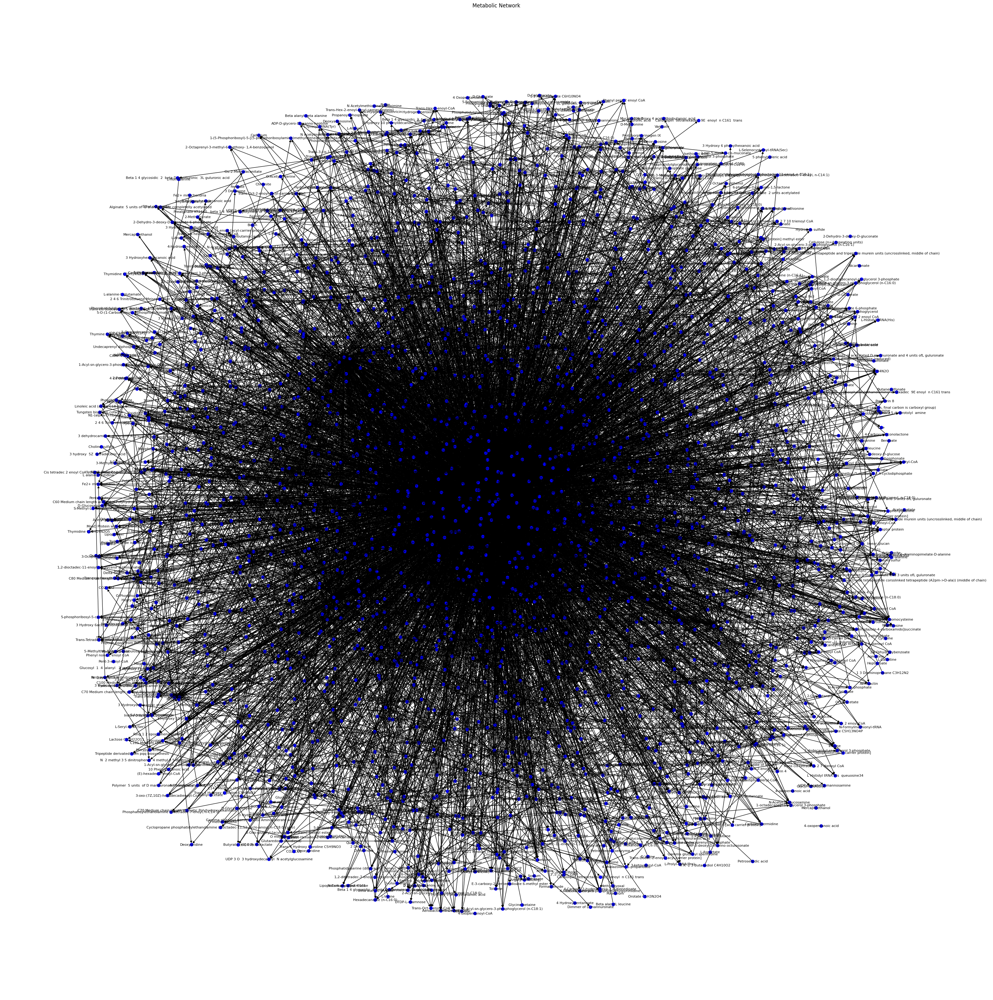

In [94]:
# 创建一个有向图
G = nx.DiGraph()

# 添加节点（代谢物）
for metabolite in model.metabolites:
    G.add_node(metabolite.id, label=metabolite.name, type='metabolite')

# 添加反应边（反应物和生成物之间的关系）
for reaction in model.reactions:
    for reactant in reaction.reactants:
        for product in reaction.products:
            # 添加反应物和生成物之间的边
            G.add_edge(reactant.id, product.id, reaction=reaction.id)


# 设置节点颜色
node_colors = []
for node in G.nodes(data=True):
    if node[1]['type'] == 'metabolite':
        node_colors.append('blue')
    else:
        node_colors.append('red')

# 绘制网络图
plt.figure(figsize=(32, 32))
pos = nx.spring_layout(G, k=0.15, iterations=20)
nx.draw(G, pos, with_labels=True, labels=nx.get_node_attributes(G, 'label'), node_color=node_colors, node_size=50, font_size=8, arrowsize=10)
plt.title('Metabolic Network')
plt.show()

In [95]:
# 导出为 GraphML 格式后续可在cytoscape中分析
nx.write_graphml(G, "metabolic_network.graphml")

In [3]:
model_PAO1.metabolites.get_by_id('3h3h_c')

Metabolite identifier,3h3h_c
Name,3-hydroxydecanoyl-3-hydroxydecanoate
Memory address,0x268727ac860
Formula,None
Compartment,c
In 2 reaction(s),"3H3H, RHLB"


In [15]:
# 定义新的代谢物（如果不存在则添加）
new_metabolites = []

if 'tpa_c' not in model.metabolites:
    tpa_c = Metabolite('tpa_c', formula='C8H4O4', name='Terephthalate', charge=-2, compartment='c')
    new_metabolites.append(tpa_c)

if 'tpa_e' not in model.metabolites:
    tpa_e = Metabolite('tpa_e', formula='C8H4O4', name='Terephthalate', charge=-2, compartment='c')
    new_metabolites.append(tpa_e)

if 'dhchdc_c' not in model.metabolites:
    dhchdc_c = Metabolite('dhchdc_c', formula='C8H6O6', name='(3S,4R)-3,4-Dihydroxycyclohexa-1,5-diene-1,4-dicarboxylate', charge=-2, compartment='c')
    new_metabolites.append(dhchdc_c)
#3,4-Dihydroxybenzoate==PCA

if '3h3h_c' not in model.metabolites:
    haa_c = Metabolite('3h3h_c', formula='C20H37O5', name='3-hydroxydecanoyl-3-hydroxydecanoate', charge=-1, compartment='c')
    new_metabolites.append(haa_c)

if 'lrhh_c' not in model.metabolites:
    lrhh_c = Metabolite('lrhh_c', formula='C26H47O9', name='L-rhamnosyl-3-hydroxydecanoyl-3-hydroxydecanoate', charge=-1, compartment='c')
    new_metabolites.append(lrhh_c)

# 将新的代谢物添加到模型中
model.add_metabolites(new_metabolites)


In [16]:
o2_c = model.metabolites.get_by_id('o2_c')
nad_c = model.metabolites.get_by_id('nad_c')
nadh_c = model.metabolites.get_by_id('nadh_c')
nadp_c = model.metabolites.get_by_id('nadp_c')
nadph_c = model.metabolites.get_by_id('nadph_c')
h_c = model.metabolites.get_by_id('h_c')
h2o_c = model.metabolites.get_by_id('h2o_c')
dhchdc_c = model.metabolites.get_by_id('dhchdc_c')  
co2_c = model.metabolites.get_by_id('co2_c') 
dhbz_c = model.metabolites.get_by_id('34dhbz_c')
hydroxydecanoyl_acp = model.metabolites.get_by_id('3hdecACP_c')
hydroxydecanoyl_hydroxydecanoate = model.metabolites.get_by_id('3h3h_c')
ACP_c = model.metabolites.get_by_id('ACP_c')
dtdprmn_c = model.metabolites.get_by_id('dtdprmn_c')
dtdp_c = model.metabolites.get_by_id('dtdp_c')
lrhh_c = model.metabolites.get_by_id('lrhh_c')

In [17]:
# 定义 TPA 的交换反应
tpa_exchange_reaction = Reaction('EX_tpa_e')
tpa_exchange_reaction.name = 'Terephthalic acid exchange'
tpa_exchange_reaction.lower_bound = 0  
tpa_exchange_reaction.upper_bound = 1000   
tpa_exchange_reaction.add_metabolites({
    tpa_e: -1  # 环境中的 TPA
})


# TPA转运反应 (tpaK)
tpa_transport = Reaction('TPA_transport')
tpa_transport.name = 'TPA_transport'
tpa_transport.lower_bound = 0  
tpa_transport.upper_bound = 1000
tpa_transport.add_metabolites({
    tpa_e: -1,
    tpa_c: 1  # Assuming tpa_e is the extracellular TPA
})

# TPA双加氧酶反应 (tphA123)
tphA123 = Reaction('TPHA123')
tphA123.name = 'TPA Dioxygenase Reaction'
tphA123.lower_bound = -1000  # 可逆反应
tphA123.upper_bound = 1000
tphA123.add_metabolites({
    tpa_c: -1,
    o2_c: -1,
    nadph_c: -1,
    h_c: -1,
    dhchdc_c: 1,
    nadp_c: 1
})

# 二醇脱氢酶反应 (tphB)
tphB = Reaction('TPHB')
tphB.name = 'Diol Dehydrogenase Reaction'
tphB.lower_bound = -1000
tphB.upper_bound = 1000
tphB.add_metabolites({
    dhchdc_c: -1,  # (3S,4R)-3,4-Dihydroxycyclohexa-1,5-diene-1,4-dicarboxylate
    nadp_c: -1,                                 
    dhbz_c: 1,                      # 3,4-Dihydroxybenzoate
    co2_c: 1,                                  
    nadph_c: 1,                                   
})

# HAA合成 (rhlA)
rhlA = Reaction('RHLA')
rhlA.name = 'Rhamnosyltransferase chain A'
rhlA.lower_bound = 0
rhlA.upper_bound = 1000
rhlA.add_metabolites({
     hydroxydecanoyl_acp: -2,  # 消耗 2 个 3hdeACP_c
    h2o_c: -1,                # 消耗 1 个 H2O
    hydroxydecanoyl_hydroxydecanoate: 1,  # 生成 1 个 3h3h_c (HAA)
    ACP_c: 2              # 生成 2 个 ACP_c
})

# 单鼠李糖脂合成 (rhlB)
rhlB = Reaction('RHLB')
rhlB.name = 'Rhamnosyltransferase chain B'
rhlB.lower_bound = 0
rhlB.upper_bound = 1000
rhlB.add_metabolites({
    hydroxydecanoyl_hydroxydecanoate: -1,  # 消耗 1 个 3h3h_c (HAA)
    dtdprmn_c: -1,                           # 消耗 1 个 dtdprmn_c
    h_c: -1,                            # 消耗 1 个 h_c
    dtdp_c: 1,                               # 生成 1 个 dtdp_c
    lrhh_c: 1                                # 生成 1 个 lrhh_c
})


# PHA降解 (phaZ)
#phaZ = Reaction('PHAZ')
#phaZ.name = 'PHA Degradation'
#phaZ.lower_bound = 0
#phaZ.upper_bound = 1000
#phaZ.add_metabolites({
#    'pha_c': -1,
#    'products_c': 1  # Replace 'products_c' with the correct degradation products
#})

# 将新的反应添加到模型中
model.add_reactions([tpa_exchange_reaction, tpa_transport, tphA123, tphB, rhlA, rhlB])

Ignoring reaction 'EX_tpa_e' since it already exists.
Ignoring reaction 'TPA_transport' since it already exists.
Ignoring reaction 'TPHA123' since it already exists.
Ignoring reaction 'TPHB' since it already exists.
Ignoring reaction 'RHLA' since it already exists.
Ignoring reaction 'RHLB' since it already exists.


In [18]:
for reaction in [tpa_exchange_reaction, tpa_transport, tphA123, tphB, rhlA, rhlB]:
    print(f"反应ID: {reaction.id}")
    print(f"反应名称: {reaction.name}")
    print(f"反应方程: {reaction.reaction}")
    print(f"下限: {reaction.lower_bound}")
    print(f"上限: {reaction.upper_bound}")
    print("\n")

反应ID: EX_tpa_e
反应名称: Terephthalic acid exchange
反应方程: tpa_e --> 
下限: 0
上限: 1000


反应ID: TPA_transport
反应名称: TPA_transport
反应方程: tpa_e --> tpa_c
下限: 0
上限: 1000


反应ID: TPHA123
反应名称: TPA Dioxygenase Reaction
反应方程: h_c + nadph_c + o2_c + tpa_c <=> dhchdc_c + nadp_c
下限: -1000
上限: 1000


反应ID: TPHB
反应名称: Diol Dehydrogenase Reaction
反应方程: dhchdc_c + nadp_c <=> 34dhbz_c + co2_c + nadph_c
下限: -1000
上限: 1000


反应ID: RHLA
反应名称: Rhamnosyltransferase chain A
反应方程: 2 3hdecACP_c + h2o_c --> 3h3h_c + 2 ACP_c
下限: 0
上限: 1000


反应ID: RHLB
反应名称: Rhamnosyltransferase chain B
反应方程: 3h3h_c + dtdprmn_c + h_c --> dtdp_c + lrhh_c
下限: 0
上限: 1000




In [20]:
for reaction in [tpa_transport, tphA123, tphB, rhlA, rhlB]:
    print(reaction.check_mass_balance())


{}
{}
{'H': -2}
{'charge': -1}
{'charge': -2, 'H': -3}


In [6]:
# 执行FBA
solution = model.optimize()

# 输出FBA结果
print(f"Objective value: {solution.objective_value}")
for reaction in model.reactions:
    print(f"{reaction.id}: {reaction.flux}")


Objective value: 0.5861175448479797
3HAD160: 0.020920879645803615
13DAMPPabcpp: 0.0
13DAMPPtex: 0.0
15DAPabcpp: 0.0
1P2CBXLCYCL: 0.0
1P2CBXLR: 0.0
1PPDCRc: 0.0
1PQQS: 0.0001307042125010995
1PY4h3cAH: 0.0
23CTI1: 0.0
23CTI2: 0.0
23CTI3: 0.0
24DECOAR: 0.0
25DKGLCNt2rpp: 0.0
25DKGLCNtex: 0.0
26DAHtex: 0.0
2AACLPGT160: 0.0
2AACLPGT161: 0.0
2AACLPGT180: 0.0
2AACLPGT181: 0.0
2AACLPPEAT160: 0.0
2AACLPPEAT161: 0.0
2AACLPPEAT180: 0.0
2AACLPPEAT181: 0.0
2AGPE160tipp: 0.0
2AGPE161tipp: 0.0
2AGPE180tipp: 0.0
2AGPE181tipp: 0.0
2AGPG160tipp: 0.0
2AGPG161tipp: 0.0
2AGPG180tipp: 0.0
2AGPG181tipp: 0.0
2DHGLCK: 0.0
2DHGLCNkt_tpp: 0.0
2DHGLCNtex: 0.0
2PQQS: 0.0001307042125010995
34DHCINMtex: 0.0
34DHCINMtpp: 0.0
34DHPHEtex: 0.0
34DHPHEtpp: 0.0
34HPPOR: 0.0
3AIBT2: 0.0
3HAACOAT100: 0.0
3HAACOAT120: 0.0
3HAACOAT121: 0.0
3HAACOAT140: -0.021419079558924393
3HAACOAT141: 0.02141907955892439
3HAACOAT60: 0.0
3HAACOAT80: 0.0
3HAD100: 0.1560889633684653
3HAD120: 0.01019375633999606
3HAD121: 0.13570145068847317
3HA

In [14]:
# 保存修改后的模型
cobra.io.write_sbml_model(model, 'modified_iJN1463.xml')


In [96]:
# 检查葡萄糖摄取反应
glucose_reaction = model.reactions.get_by_id('EX_glc__D_e')


In [19]:
# 设置目标产物的反应为目标函数
model.objective = 'EX_etoh_e'

# 优化模型以最大化目标产物的产量
solution = model.optimize()
print(f"最大化乙醇产量: {solution.objective_value} mmol/gDW/h")


最大化乙醇产量: 19.92333333333332 mmol/gDW/h


In [97]:
# 设置葡萄糖的摄取反应为目标函数
model.objective = 'EX_glc__D_e'

# 优化模型以最大化葡萄糖的利用
solution = model.optimize()
print(f"最大化葡萄糖利用率: {solution.objective_value} mmol/gDW/h")


最大化葡萄糖利用率: -0.04229885057471263 mmol/gDW/h


In [22]:

# 重新优化模型
model.objective = 'EX_etoh_e'
solution = model.optimize()
print(f"在设定的葡萄糖摄取速率下，最大化乙醇产量: {solution.objective_value} mmol/gDW/h")


在设定的葡萄糖摄取速率下，最大化乙醇产量: 19.923333333333353 mmol/gDW/h


In [ ]:
# 检查代谢物平衡
summary = model.summary()
print(summary)


In [27]:
# 检查生物质反应
biomass_reaction = model.reactions.get_by_id('BIOMASS_KT2440_Core2')
model.objective = biomass_reaction

# 优化模型以最大化生物质产量
solution = model.optimize()
print(f"最大化生物质产量: {solution.objective_value} mmol/gDW/h")

# 检查葡萄糖摄取速率
glucose_uptake = solution.fluxes[glucose_reaction.id]
print(f"葡萄糖摄取速率: {glucose_uptake} mmol/gDW/h")


最大化生物质产量: 0.9802804228546067 mmol/gDW/h
葡萄糖摄取速率: -10.0 mmol/gDW/h


In [ ]:
# 获取与基因X相关的反应
reaction_X = model.reactions.get_by_id('reaction_X')

# 将该反应的上下限设置为0，相当于敲除该基因
reaction_X.lower_bound = 0
reaction_X.upper_bound = 0

# 重新优化模型
solution = model.optimize()
print(f"敲除基因X后，乙醇产量: {solution.objective_value} mmol/gDW/h")
